### About the Dataset: 

1. There are two datsets. We need to solve the challenges that are faced by the bank during credit lending. 
2. First dataset is (i)  Internal bank dataset and second datset is (ii) Cibil external dataset.
3. The target variable is Approved_Flag  which contain 4 categories ['P2' 'P1' 'P3' 'P4'], segregating  the customer into class of giving the credit. P1 being the category where the bank can easier give the credit to that customer whereas P4 being the category where it is not a good idea to give the credit to that customer, as it can increase the NPA accounts(Non-Performing assets) of the bank.
4. There are total 84 columns in two datasets. 26 columns in the first dataset and 62 columns in the second dataset. 
5. PROSPECTID col is a common column in both the first and second datasets indicating unique customer ID.
6. To find association between numerical and numerical columns we will perform VIF test (Variance Inflation Factor). Reject columns whose value is greater than a particular threshold.
6. For feature selection,  we will perform chi2 square test and Anova test, since the target column is multi-class categorical column.
7. By checking the p_value of each column wrt target variable, we can  decide if it's statistically significant or not


In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

In [2]:
pip install plotly

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


In [3]:
import plotly.express as px

In [4]:
pip install openpyxl

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


In [5]:
df1 = pd.read_excel('Dataset/bank_dataset_(internal).xlsx')
df2 = pd.read_excel('Dataset/cibil_dataset_(external).xlsx')


In [6]:
df1.shape

(51336, 26)

In [7]:
df1.columns

Index(['PROSPECTID', 'Total_TL', 'Tot_Closed_TL', 'Tot_Active_TL',
       'Total_TL_opened_L6M', 'Tot_TL_closed_L6M', 'pct_tl_open_L6M',
       'pct_tl_closed_L6M', 'pct_active_tl', 'pct_closed_tl',
       'Total_TL_opened_L12M', 'Tot_TL_closed_L12M', 'pct_tl_open_L12M',
       'pct_tl_closed_L12M', 'Tot_Missed_Pmnt', 'Auto_TL', 'CC_TL',
       'Consumer_TL', 'Gold_TL', 'Home_TL', 'PL_TL', 'Secured_TL',
       'Unsecured_TL', 'Other_TL', 'Age_Oldest_TL', 'Age_Newest_TL'],
      dtype='object')

In [8]:
print(f"Size of bank internal dataset {df1.shape}")
print(df1.sample(10))

Size of bank internal dataset (51336, 26)
       PROSPECTID  Total_TL  Tot_Closed_TL  Tot_Active_TL   
8047         8048         1              1              0  \
42582       42583         7              3              4   
38292       38293         1              0              1   
28553       28554         1              1              0   
46329       46330         3              2              1   
46181       46182         2              0              2   
39624       39625         1              0              1   
12066       12067         2              0              2   
38451       38452         2              1              1   
32743       32744        12              9              3   

       Total_TL_opened_L6M  Tot_TL_closed_L6M  pct_tl_open_L6M   
8047                     0                  0            0.000  \
42582                    0                  0            0.000   
38292                    0                  0            0.000   
28553                 

In [9]:
feature_details = pd.read_excel('Dataset/Features_Target_Description.xlsx')
feature_details

,Case_study1 table,Variable Name,Description
0,Internal,Total_TL,Total trade lines/accounts in Bureau
1,NaN,Tot_Closed_TL,Total closed trade lines/accounts
2,NaN,Tot_Active_TL,Total active accounts
3,NaN,Total_TL_opened_L6M,Total accounts opened in last 6 Months
4,NaN,Tot_TL_closed_L6M,Total accounds closes in last 6 months
...,...,...,...
83,NaN,GL_Flag,Gold Loan Flag
84,NaN,last_prod_enq2,Lates product enquired for
85,NaN,first_prod_enq2,First productd enquired for
86,NaN,Credit_Score,Applicant's credit score


In [10]:
print(f"Size of cibil dataset {df2.shape}")
print(df2.sample(10))

Size of cibil dataset (51336, 62)
       PROSPECTID  time_since_recent_payment  time_since_first_deliquency   
27281       27282                         46                       -99999  \
39451       39452                        380                       -99999   
13042       13043                         78                           25   
44045       44046                         77                            6   
50053       50054                         45                       -99999   
21861       21862                        239                       -99999   
38204       38205                         54                       -99999   
8882         8883                        190                       -99999   
41011       41012                       1219                       -99999   
18307       18308                         62                           10   

       time_since_recent_deliquency  num_times_delinquent   
27281                        -99999                     0

In [11]:
df2.shape

(51336, 62)

In [12]:
df2.columns

Index(['PROSPECTID', 'time_since_recent_payment',
       'time_since_first_deliquency', 'time_since_recent_deliquency',
       'num_times_delinquent', 'max_delinquency_level',
       'max_recent_level_of_deliq', 'num_deliq_6mts', 'num_deliq_12mts',
       'num_deliq_6_12mts', 'max_deliq_6mts', 'max_deliq_12mts',
       'num_times_30p_dpd', 'num_times_60p_dpd', 'num_std', 'num_std_6mts',
       'num_std_12mts', 'num_sub', 'num_sub_6mts', 'num_sub_12mts', 'num_dbt',
       'num_dbt_6mts', 'num_dbt_12mts', 'num_lss', 'num_lss_6mts',
       'num_lss_12mts', 'recent_level_of_deliq', 'tot_enq', 'CC_enq',
       'CC_enq_L6m', 'CC_enq_L12m', 'PL_enq', 'PL_enq_L6m', 'PL_enq_L12m',
       'time_since_recent_enq', 'enq_L12m', 'enq_L6m', 'enq_L3m',
       'MARITALSTATUS', 'EDUCATION', 'AGE', 'GENDER', 'NETMONTHLYINCOME',
       'Time_With_Curr_Empr', 'pct_of_active_TLs_ever',
       'pct_opened_TLs_L6m_of_L12m', 'pct_currentBal_all_TL', 'CC_utilization',
       'CC_Flag', 'PL_utilization', 'PL_Fla

### Important points: 
1. The shape of bank internal dataset of customer is (51336, 26).
2. The shape of cibil dataset is (51336, 62).
3. The common column in both datset is PROSPECTID which is unique ID for each customer.
4. The value "-99999" are null values in both the daetset
5. We will remove all the null values if data lost is less than 20% of the total dataset. 
6. Total trade lines is total no of accounts of a customer


### Removing columns that contain more than 10000 null rows

In [13]:
def null_value_columns(data_frame:pd.DataFrame):
    drop_cols = []
    data_frame = data_frame.replace(-99999, np.nan)
    for cols in data_frame.columns:
        if data_frame[cols].isnull().sum()>10000:
            drop_cols.append(cols)
    
    return drop_cols

In [14]:
drop_cols_df1 = null_value_columns(data_frame=df1)

In [15]:
len(drop_cols_df1)

0

In [16]:
drop_cols_df2 = null_value_columns(data_frame=df2)

In [17]:
len(drop_cols_df2)

8

In [18]:
df2.drop(columns=drop_cols_df2, axis=1, inplace=True)

In [19]:
df2.shape

(51336, 54)

In [20]:
def check_no_of_null_rows(df:pd.DataFrame):
    dict_of_null_value = {}
    df = df.replace(-99999, np.nan)
    for col in df.columns:
        dict_of_null_value[col] = df[col].isnull().sum()
        dict_of_null_value_filtered = {k: v for k, v in dict_of_null_value.items() if v > 0}
    return dict_of_null_value_filtered

In [21]:
check_no_of_null_rows(df=df2)

{'time_since_recent_payment': 4291,
 'tot_enq': 6321,
 'CC_enq': 6321,
 'CC_enq_L6m': 6321,
 'CC_enq_L12m': 6321,
 'PL_enq': 6321,
 'PL_enq_L6m': 6321,
 'PL_enq_L12m': 6321,
 'time_since_recent_enq': 6321,
 'enq_L12m': 6321,
 'enq_L6m': 6321,
 'enq_L3m': 6321,
 'pct_currentBal_all_TL': 72}

## Columns that have null values in df are:
1. 'Age_Oldest_TL': 40
2. 'Age_Newest_TL': 40
3. 'time_since_recent_payment': 4291
4. 'tot_enq': 6321,
5. 'CC_enq': 6321,
6. 'CC_enq_L6m': 6321,
7. 'CC_enq_L12m': 6321,
8. 'PL_enq': 6321,
9. 'PL_enq_L6m': 6321,
10. 'PL_enq_L12m': 6321,
11. 'time_since_recent_enq': 6321,
12. 'enq_L12m': 6321,
13. 'enq_L6m': 6321,
14. 'enq_L3m': 6321,
15. 'pct_currentBal_all_TL': 72


### Removing all the rows of columns that contain null values

In [22]:
df1.shape

(51336, 26)

In [23]:
# Remove nulls
df1 = df1.loc[df1['Age_Oldest_TL'] != -99999]
print(df1.shape)


(51296, 26)


In [24]:
df2.shape

(51336, 54)

In [25]:
for i in df2.columns:
    df2 = df2.loc[ df2['time_since_recent_enq'] != -99999 ]

In [26]:
df2.shape

(45015, 54)

### Merging both the dataset on common column "PROSPECTID"

In [27]:
df = pd.merge(left=df1, right=df2, how='inner', left_on=['PROSPECTID'], right_on=['PROSPECTID'])
df.sample(10)

,PROSPECTID,Total_TL,Tot_Closed_TL,Tot_Active_TL,Total_TL_opened_L6M,Tot_TL_closed_L6M,pct_tl_open_L6M,pct_tl_closed_L6M,pct_active_tl,pct_closed_tl,...,pct_PL_enq_L6m_of_L12m,pct_CC_enq_L6m_of_L12m,pct_PL_enq_L6m_of_ever,pct_CC_enq_L6m_of_ever,HL_Flag,GL_Flag,last_prod_enq2,first_prod_enq2,Credit_Score,Approved_Flag
10215,11598,17,8,9,6,1,0.353,0.059,0.529,0.471,...,1.0,0.25,0.25,0.2,1,0,ConsumerLoan,AL,672,P2
40742,46511,4,4,0,0,0,0.000,0.000,0.000,1.000,...,0.0,0.00,0.00,0.0,0,0,ConsumerLoan,others,686,P2
17609,20101,2,0,2,2,0,1.000,0.000,1.000,0.000,...,0.0,0.00,0.00,0.0,0,0,others,others,663,P3
26605,30412,2,1,1,0,0,0.000,0.000,0.500,0.500,...,0.0,0.00,0.00,0.0,0,0,others,others,698,P2
27677,31608,1,0,1,0,0,0.000,0.000,1.000,0.000,...,0.0,0.00,0.00,0.0,0,0,others,ConsumerLoan,660,P3
8890,10077,1,0,1,0,0,0.000,0.000,1.000,0.000,...,0.0,0.00,0.00,0.0,0,0,ConsumerLoan,ConsumerLoan,658,P4
39421,44978,4,2,2,1,1,0.250,0.250,0.500,0.500,...,0.0,0.00,0.00,0.0,1,0,others,others,677,P2
23409,26764,2,1,1,0,0,0.000,0.000,0.500,0.500,...,0.0,0.00,0.00,0.0,0,0,others,CC,681,P2
14652,16688,4,0,4,1,0,0.250,0.000,1.000,0.000,...,1.0,0.00,0.50,0.0,0,1,PL,others,697,P2
23693,27084,4,3,1,1,0,0.250,0.000,0.250,0.750,...,1.0,0.00,0.50,0.0,0,0,ConsumerLoan,others,657,P4


In [28]:
df.shape 

(44990, 79)

In [29]:
df.columns

Index(['PROSPECTID', 'Total_TL', 'Tot_Closed_TL', 'Tot_Active_TL',
       'Total_TL_opened_L6M', 'Tot_TL_closed_L6M', 'pct_tl_open_L6M',
       'pct_tl_closed_L6M', 'pct_active_tl', 'pct_closed_tl',
       'Total_TL_opened_L12M', 'Tot_TL_closed_L12M', 'pct_tl_open_L12M',
       'pct_tl_closed_L12M', 'Tot_Missed_Pmnt', 'Auto_TL', 'CC_TL',
       'Consumer_TL', 'Gold_TL', 'Home_TL', 'PL_TL', 'Secured_TL',
       'Unsecured_TL', 'Other_TL', 'Age_Oldest_TL', 'Age_Newest_TL',
       'time_since_recent_payment', 'num_times_delinquent',
       'max_recent_level_of_deliq', 'num_deliq_6mts', 'num_deliq_12mts',
       'num_deliq_6_12mts', 'num_times_30p_dpd', 'num_times_60p_dpd',
       'num_std', 'num_std_6mts', 'num_std_12mts', 'num_sub', 'num_sub_6mts',
       'num_sub_12mts', 'num_dbt', 'num_dbt_6mts', 'num_dbt_12mts', 'num_lss',
       'num_lss_6mts', 'num_lss_12mts', 'recent_level_of_deliq', 'tot_enq',
       'CC_enq', 'CC_enq_L6m', 'CC_enq_L12m', 'PL_enq', 'PL_enq_L6m',
       'PL_enq_L12

### Seprating categorical and numerical col

In [30]:
cat_col = []
for cols in df.columns:
    if df[cols].dtype=='object':
        cat_col.append(cols)

cat_col

['MARITALSTATUS',
 'EDUCATION',
 'GENDER',
 'last_prod_enq2',
 'first_prod_enq2',
 'Approved_Flag']

In [31]:
for col in cat_col:
    print(f"{col} : {df[col].unique()}")
    print("*"*50)
    print()

MARITALSTATUS : ['Married' 'Single']
**************************************************

EDUCATION : ['12TH' 'GRADUATE' 'SSC' 'POST-GRADUATE' 'UNDER GRADUATE' 'OTHERS'
 'PROFESSIONAL']
**************************************************

GENDER : ['M' 'F']
**************************************************

last_prod_enq2 : ['PL' 'ConsumerLoan' 'AL' 'CC' 'others' 'HL']
**************************************************

first_prod_enq2 : ['PL' 'ConsumerLoan' 'others' 'AL' 'HL' 'CC']
**************************************************

Approved_Flag : ['P2' 'P1' 'P3' 'P4']
**************************************************



## Perform chi2 Square test for all categorical columns wrt target column i.e. Approved_Flag

chi2_square test is for cat v/s cat columns

In [32]:
from scipy.stats import chi2_contingency
categorical_cols = ['MARITALSTATUS','EDUCATION','GENDER','last_prod_enq2','first_prod_enq2']
for col in categorical_cols:
    chi2, pval, _, _ = chi2_contingency(pd.crosstab(df[col], df['Approved_Flag']))
    print(f"p_value of {col} : {pval}")


p_value of MARITALSTATUS : 1.848867548084044e-244
p_value of EDUCATION : 1.4046535546725432e-31
p_value of GENDER : 2.246456579867409e-05
p_value of last_prod_enq2 : 0.0
p_value of first_prod_enq2 : 1.9006158203375567e-287


### Since the p_value of all categorical columns is less than 0.05, therefore all the categorical columns are important to build the credit modelling model. 

### First we need to perform multi linearity between numerical cols. If 2 or more cols are co-related / co-linear we will keep only one of the numerical columns. Then we perform ANOVA test to reduce more features. 

### For multi linearity we will use VIF (Variance Inflation Factor). If the value of VIF is less than 6, we will keep the column, otherwise we will drop it. 

In [33]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [34]:
# VIF for numerical columns
numeric_columns = []
for i in df.columns:
    if df[i].dtype != 'object' and i not in ['PROSPECTID','Approved_Flag']:
        numeric_columns.append(i)
len(numeric_columns)

72

In [35]:
vif_data = df[numeric_columns]
total_columns = vif_data.shape[1]
columns_to_be_kept = []
column_index = 0

print(total_columns)
vif_data.shape[0]

72


44990

In [36]:
vif_data

,Total_TL,Tot_Closed_TL,Tot_Active_TL,Total_TL_opened_L6M,Tot_TL_closed_L6M,pct_tl_open_L6M,pct_tl_closed_L6M,pct_active_tl,pct_closed_tl,Total_TL_opened_L12M,...,pct_currentBal_all_TL,CC_Flag,PL_Flag,pct_PL_enq_L6m_of_L12m,pct_CC_enq_L6m_of_L12m,pct_PL_enq_L6m_of_ever,pct_CC_enq_L6m_of_ever,HL_Flag,GL_Flag,Credit_Score
0,5,4,1,0,0,0.000,0.00,0.200,0.800,0,...,0.798,0,1,0.0,0.0,0.000,0.0,1,0,696
1,1,0,1,0,0,0.000,0.00,1.000,0.000,1,...,0.370,0,0,0.0,0.0,0.000,0.0,0,0,685
2,8,0,8,1,0,0.125,0.00,1.000,0.000,2,...,0.585,0,0,0.0,0.0,0.000,0.0,1,0,693
3,3,2,1,0,0,0.000,0.00,0.333,0.667,0,...,0.000,0,0,0.0,0.0,0.000,0.0,0,0,753
4,6,5,1,0,0,0.000,0.00,0.167,0.833,0,...,0.000,0,0,1.0,0.0,0.429,0.0,1,0,668
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
44985,3,0,3,1,0,0.333,0.00,1.000,0.000,1,...,0.230,0,0,0.0,0.0,0.000,0.0,0,0,650
44986,4,2,2,0,1,0.000,0.25,0.500,0.500,2,...,0.660,0,0,0.0,0.0,0.000,0.0,0,0,702
44987,2,1,1,1,1,0.500,0.50,0.500,0.500,2,...,0.428,0,0,1.0,0.0,1.000,0.0,0,0,661
44988,2,1,1,0,0,0.000,0.00,0.500,0.500,1,...,0.143,0,0,0.0,0.0,0.000,0.0,0,0,686


In [37]:
# VIF sequentially check (code by sir)

vif_data = df[numeric_columns]
total_columns = vif_data.shape[1]
columns_to_be_kept = []
column_index = 0



for i in range (0,total_columns):
    
    vif_value = variance_inflation_factor(vif_data, column_index)
    print (numeric_columns[column_index],'---',vif_value)
    
    
    if vif_value <= 6:
        columns_to_be_kept.append( numeric_columns[i])
        column_index = column_index+1
    
    else:
        vif_data = vif_data.drop([ numeric_columns[i] ], axis=1)

/Users/aakanksha/Library/Python/3.9/lib/python/site-packages/statsmodels/stats/outliers_influence.py:198: RuntimeWarning: divide by zero encountered in scalar divide
  vif = 1. / (1. - r_squared_i)


Total_TL --- inf


/Users/aakanksha/Library/Python/3.9/lib/python/site-packages/statsmodels/stats/outliers_influence.py:198: RuntimeWarning: divide by zero encountered in scalar divide
  vif = 1. / (1. - r_squared_i)


Total_TL --- inf
Total_TL --- 11.315915756765458
Total_TL --- 8.290647794160552
Total_TL --- 6.536028570768031
Total_TL --- 5.606150437344504
Tot_Closed_TL --- 2.5873386786042527


/Users/aakanksha/Library/Python/3.9/lib/python/site-packages/statsmodels/stats/outliers_influence.py:198: RuntimeWarning: divide by zero encountered in scalar divide
  vif = 1. / (1. - r_squared_i)


Tot_Active_TL --- inf
Tot_Active_TL --- 1776.294785280663
Tot_Active_TL --- 8.428870220099274
Tot_Active_TL --- 3.8063521384565404
Total_TL_opened_L6M --- 6.17244713005533
Total_TL_opened_L6M --- 5.366023216792181
Tot_TL_closed_L6M --- 2.016889412988318


/Users/aakanksha/Library/Python/3.9/lib/python/site-packages/statsmodels/stats/outliers_influence.py:198: RuntimeWarning: divide by zero encountered in scalar divide
  vif = 1. / (1. - r_squared_i)


pct_tl_open_L6M --- inf
pct_tl_open_L6M --- 4.836031376951699
pct_tl_closed_L6M --- 22.828628923372452
pct_tl_closed_L6M --- 30.296545590163007
pct_tl_closed_L6M --- 4.435553077793609
pct_active_tl --- 3.060900841901612
pct_closed_tl --- 2.8495898016577588
Total_TL_opened_L12M --- 4.336324767823461
Tot_TL_closed_L12M --- 2.199664558984135
pct_tl_open_L12M --- 4.936432294963126
pct_tl_closed_L12M --- 3.0380813826446986
Tot_Missed_Pmnt --- 1.2184459801064504
Auto_TL --- 7.87222333498008
Auto_TL --- 5.333026488171541


/Users/aakanksha/Library/Python/3.9/lib/python/site-packages/statsmodels/stats/outliers_influence.py:198: RuntimeWarning: divide by zero encountered in scalar divide
  vif = 1. / (1. - r_squared_i)


CC_TL --- inf
CC_TL --- 7.366445575081072
CC_TL --- 1.4193592924935055
Consumer_TL --- 8.189781823908591
Consumer_TL --- 1.6291491025561786
Gold_TL --- 7.219324196419113
Gold_TL --- 15.390410731785682
Gold_TL --- 1.8177103788604199
Home_TL --- 1.4940960366722664
PL_TL --- 2.1691190741328095
Secured_TL --- 2.6081349707250654
Unsecured_TL --- 2.224382472049578
Other_TL --- 7.345901506091012
Other_TL --- 2.0957188106970817
Age_Oldest_TL --- 2.8668192906829923
Age_Newest_TL --- 6.457571955870084
Age_Newest_TL --- 2.8460099367394673
time_since_recent_payment --- 4.839411552712322
num_times_delinquent --- 16.1750933040991
num_times_delinquent --- 6.405659510382015
num_times_delinquent --- 8.875592715815126
num_times_delinquent --- 2.3720692055920156
max_recent_level_of_deliq --- 8.661546714832273
max_recent_level_of_deliq --- 13.106164131205174
max_recent_level_of_deliq --- 3.4951555183583767
num_deliq_6mts --- 1.8735282411208276
num_deliq_12mts --- 16.991455774575776
num_deliq_12mts --- 10.

In [38]:
print(len(columns_to_be_kept))
print(columns_to_be_kept)

39
['pct_tl_open_L6M', 'pct_tl_closed_L6M', 'Tot_TL_closed_L12M', 'pct_tl_closed_L12M', 'Tot_Missed_Pmnt', 'CC_TL', 'Home_TL', 'PL_TL', 'Secured_TL', 'Unsecured_TL', 'Other_TL', 'Age_Oldest_TL', 'Age_Newest_TL', 'time_since_recent_payment', 'max_recent_level_of_deliq', 'num_deliq_6_12mts', 'num_times_60p_dpd', 'num_std_12mts', 'num_sub', 'num_sub_6mts', 'num_sub_12mts', 'num_dbt', 'num_dbt_12mts', 'num_lss', 'num_lss_12mts', 'recent_level_of_deliq', 'CC_enq_L12m', 'PL_enq_L12m', 'time_since_recent_enq', 'enq_L3m', 'NETMONTHLYINCOME', 'Time_With_Curr_Empr', 'pct_currentBal_all_TL', 'CC_Flag', 'PL_Flag', 'pct_PL_enq_L6m_of_ever', 'pct_CC_enq_L6m_of_ever', 'HL_Flag', 'GL_Flag']


In [39]:
# # Calculate VIF (code by me)
# vif_data = df[numeric_columns]
# total_columns = vif_data.shape[1]
# columns_to_be_kept = []

# for col_index in range(total_columns):
#     vif_value = variance_inflation_factor(vif_data, col_index)

#     print(numeric_columns[col_index], "-------", vif_value)

#     if vif_value <= 6:
#         columns_to_be_kept.append(numeric_columns[col_index])
        
#     else:
#         vif_data = vif_data.drop([numeric_columns[i]], axis=1)
    

# # Filter the columns to be kept from the original DataFrame
# vif_data_filtered = df[columns_to_be_kept]


In [40]:
# print(len(columns_to_be_kept))
# print(columns_to_be_kept)

### Performing ANOVA test for all numerical columns w.r.t target column 

Anova test is for num cols v/s cat column, but when the target column have multiple categories. If there is only two categories in the target column then t_test is the way to go. 

In [41]:
# check Anova for columns_to_be_kept 
from scipy.stats import f_oneway

# Assuming df is the DataFrame and columns_to_be_kept is the list of column names to be tested

columns_to_be_kept_numerical = []

for i in columns_to_be_kept:
    a = list(df[i])
    b = list(df['Approved_Flag'])
    
    # Group data based on Approved_Flag
    group_P1 = [value for value, group in zip(a, b) if group == 'P1']
    group_P2 = [value for value, group in zip(a, b) if group == 'P2']
    group_P3 = [value for value, group in zip(a, b) if group == 'P3']
    group_P4 = [value for value, group in zip(a, b) if group == 'P4']

    # Ensure none of the groups are empty
    if len(group_P1) == 0 or len(group_P2) == 0 or len(group_P3) == 0 or len(group_P4) == 0:
        print(f"Skipping column {i} due to empty groups.")
        continue

    # Perform ANOVA
    try:
        f_statistic, p_value = f_oneway(group_P1, group_P2, group_P3, group_P4)
        print(i, "-----", p_value)
        
        # Add the column to the list if p-value is significant (<= 0.05)
        if p_value <= 0.05:
            columns_to_be_kept_numerical.append(i)
    except Exception as e:
        print(f"Error processing column {i}: {e}")


pct_tl_open_L6M ----- 0.0
pct_tl_closed_L6M ----- 2.1779866552092655e-43
Tot_TL_closed_L12M ----- 5.968891726867921e-118
pct_tl_closed_L12M ----- 7.668438574833e-39
Tot_Missed_Pmnt ----- 2.7701223906810007e-200
CC_TL ----- 2.4163576245489686e-62
Home_TL ----- 0.0
PL_TL ----- 1.92183874465862e-261
Secured_TL ----- 0.0
Unsecured_TL ----- 2.7309986528014018e-137
Other_TL ----- 0.0
Age_Oldest_TL ----- 0.0
Age_Newest_TL ----- 1.210652493042949e-100
time_since_recent_payment ----- 5.9991206749304446e-62
max_recent_level_of_deliq ----- 2.474297904376188e-90
num_deliq_6_12mts ----- 8.555961029712396e-60
num_times_60p_dpd ----- 9.174947498265079e-67
num_std_12mts ----- 0.0
num_sub ----- 9.672701981105293e-26
num_sub_6mts ----- 0.01006215948025348
num_sub_12mts ----- 0.0004155056316913837
num_dbt ----- 4.827033307775628e-13
num_dbt_12mts ----- 0.0032009217781671386
num_lss ----- 0.005816793601494153
num_lss_12mts ----- 0.31910124758676983
recent_level_of_deliq ----- 1.1220673341977097e-107
CC_en

In [42]:
print(len(columns_to_be_kept_numerical))
print(columns_to_be_kept_numerical)


37
['pct_tl_open_L6M', 'pct_tl_closed_L6M', 'Tot_TL_closed_L12M', 'pct_tl_closed_L12M', 'Tot_Missed_Pmnt', 'CC_TL', 'Home_TL', 'PL_TL', 'Secured_TL', 'Unsecured_TL', 'Other_TL', 'Age_Oldest_TL', 'Age_Newest_TL', 'time_since_recent_payment', 'max_recent_level_of_deliq', 'num_deliq_6_12mts', 'num_times_60p_dpd', 'num_std_12mts', 'num_sub', 'num_sub_6mts', 'num_sub_12mts', 'num_dbt', 'num_dbt_12mts', 'num_lss', 'recent_level_of_deliq', 'CC_enq_L12m', 'PL_enq_L12m', 'time_since_recent_enq', 'enq_L3m', 'NETMONTHLYINCOME', 'Time_With_Curr_Empr', 'CC_Flag', 'PL_Flag', 'pct_PL_enq_L6m_of_ever', 'pct_CC_enq_L6m_of_ever', 'HL_Flag', 'GL_Flag']


In [43]:
categorical_cols = ['MARITALSTATUS', 'EDUCATION', 'GENDER', 'last_prod_enq2', 'first_prod_enq2']

target_col = ["Approved_Flag"]

# Combine the lists of columns into one list
all_columns = categorical_cols + columns_to_be_kept_numerical + target_col

# Select the combined columns from the DataFrame
df_final = df[all_columns]

# Sample 10 rows from the final DataFrame
df_final.sample(10)


,MARITALSTATUS,EDUCATION,GENDER,last_prod_enq2,first_prod_enq2,pct_tl_open_L6M,pct_tl_closed_L6M,Tot_TL_closed_L12M,pct_tl_closed_L12M,Tot_Missed_Pmnt,...,enq_L3m,NETMONTHLYINCOME,Time_With_Curr_Empr,CC_Flag,PL_Flag,pct_PL_enq_L6m_of_ever,pct_CC_enq_L6m_of_ever,HL_Flag,GL_Flag,Approved_Flag
14599,Married,GRADUATE,F,ConsumerLoan,ConsumerLoan,0.000,0.000,0,0.000,0,...,1,12500,31,0,0,0.0,0.0,0,0,P3
16986,Married,12TH,M,ConsumerLoan,ConsumerLoan,0.500,0.000,0,0.000,1,...,7,25000,306,0,0,1.0,1.0,0,0,P4
22222,Married,12TH,M,ConsumerLoan,ConsumerLoan,0.000,0.000,0,0.000,3,...,1,15000,71,0,0,0.0,0.0,0,0,P3
1026,Married,GRADUATE,M,others,ConsumerLoan,0.333,0.333,1,0.333,1,...,5,14500,29,0,0,0.6,1.0,0,0,P4
10002,Single,GRADUATE,M,others,others,1.000,0.000,0,0.000,0,...,1,15000,21,0,0,0.0,0.0,0,0,P3
36092,Single,UNDER GRADUATE,F,ConsumerLoan,ConsumerLoan,0.000,0.000,1,0.500,0,...,1,12000,47,0,0,0.0,0.0,0,0,P2
37188,Married,GRADUATE,M,ConsumerLoan,ConsumerLoan,0.000,0.000,0,0.000,1,...,0,29000,80,0,0,0.0,0.0,0,0,P2
4976,Married,GRADUATE,M,ConsumerLoan,others,0.000,0.000,0,0.000,0,...,2,12500,442,0,0,0.0,0.0,0,0,P2
11201,Married,UNDER GRADUATE,M,others,AL,0.000,0.000,1,0.500,0,...,0,30000,125,0,0,0.0,0.0,0,0,P1
40056,Married,GRADUATE,M,PL,PL,0.200,0.200,1,0.200,1,...,0,45000,89,1,1,0.5,0.0,0,0,P2


In [44]:
df_final.shape

(44990, 43)

In [45]:
df_final.to_csv('df_final.csv')

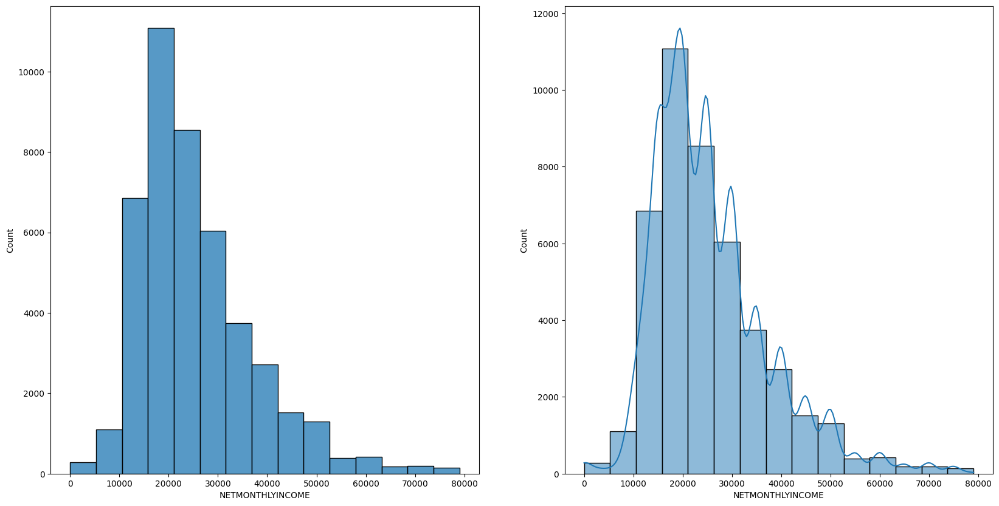

In [46]:
pct_net_income = df_final['NETMONTHLYINCOME'].quantile(0.99)
plt.figure(figsize=(20,10))
plt.subplot(1,2,1)
sns.histplot(data=df_final[df_final['NETMONTHLYINCOME']<pct_net_income], x='NETMONTHLYINCOME', bins=15)
plt.subplot(1,2,2)
sns.histplot(data=df_final[df_final['NETMONTHLYINCOME']<pct_net_income], x='NETMONTHLYINCOME', bins=15, kde=True)
plt.show()


### Most of the people in the dataset have monthly salary between 15k-25k 

In [47]:
fig = px.box(data_frame = df_final[df_final['NETMONTHLYINCOME']<pct_net_income], x='GENDER', y='NETMONTHLYINCOME', color='Approved_Flag')
fig.update_layout(title_text='monthly income distribution w.r.t gender in all categories')
fig.show()

### Most of the people in the dataset have monthly salary between 15k-25k 

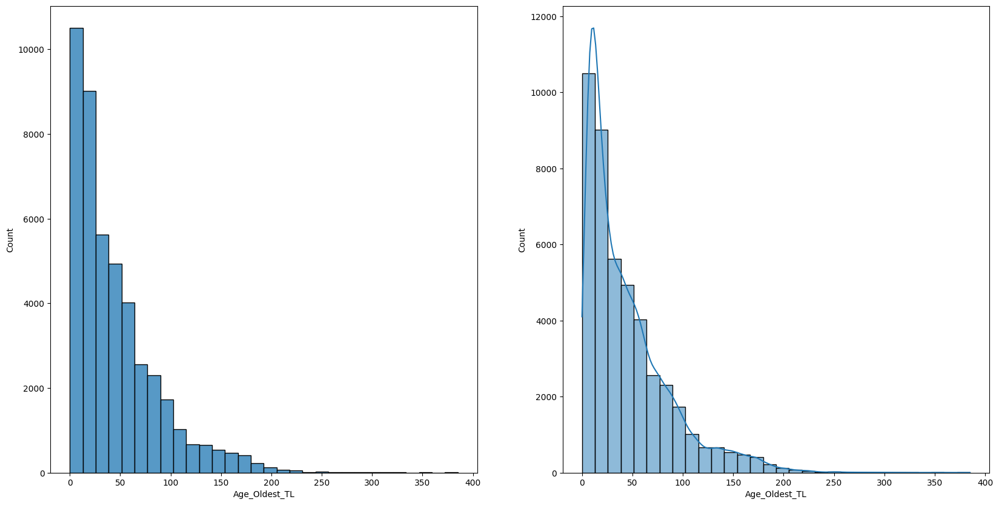

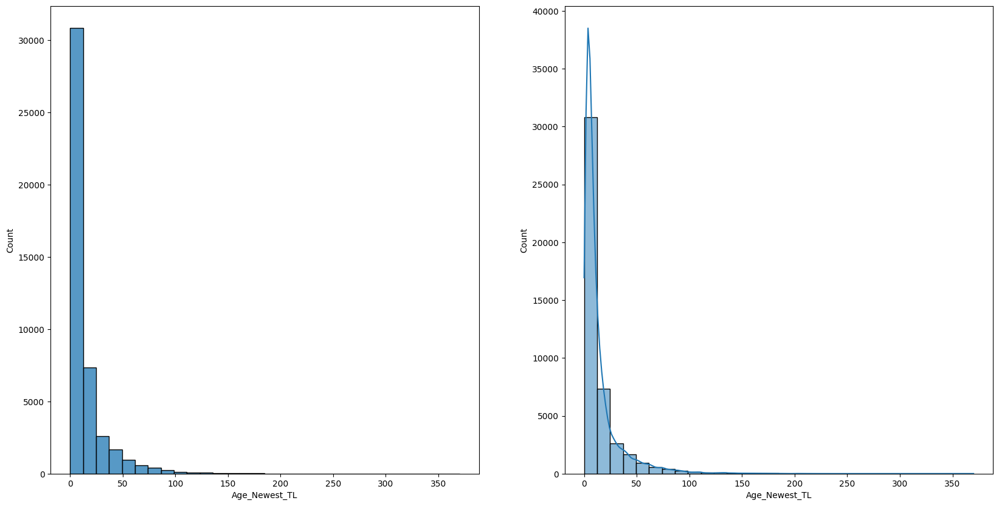

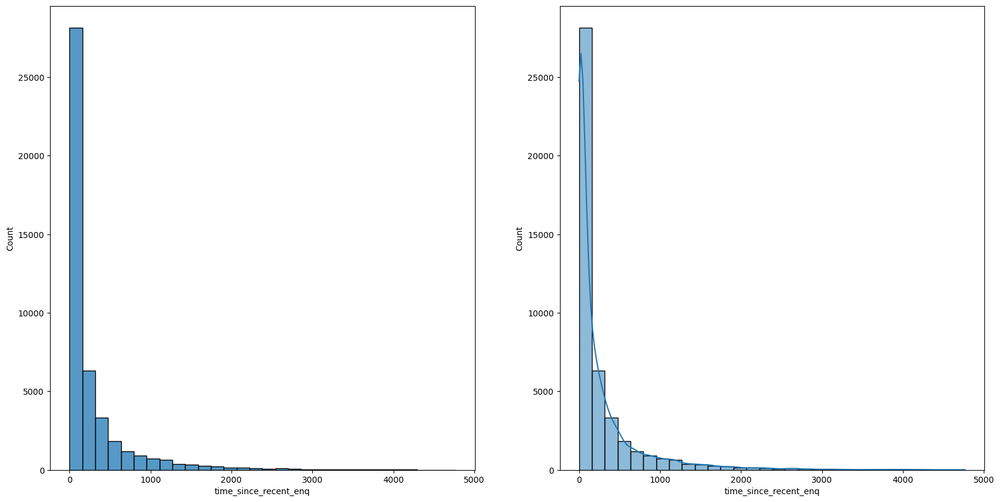

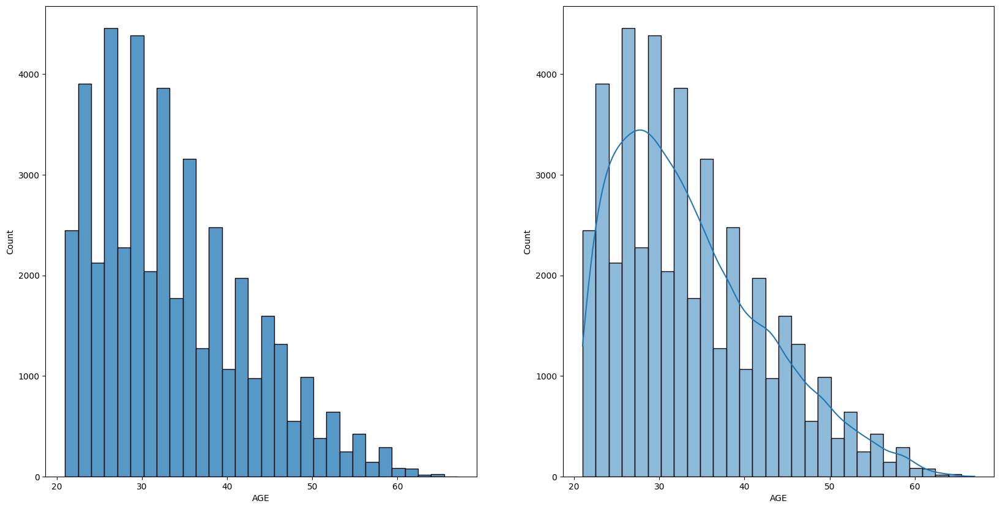

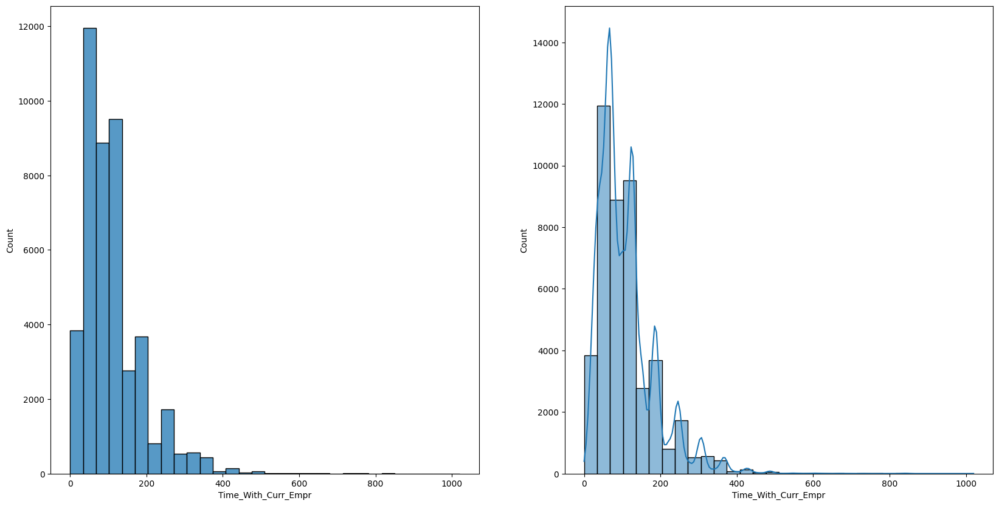

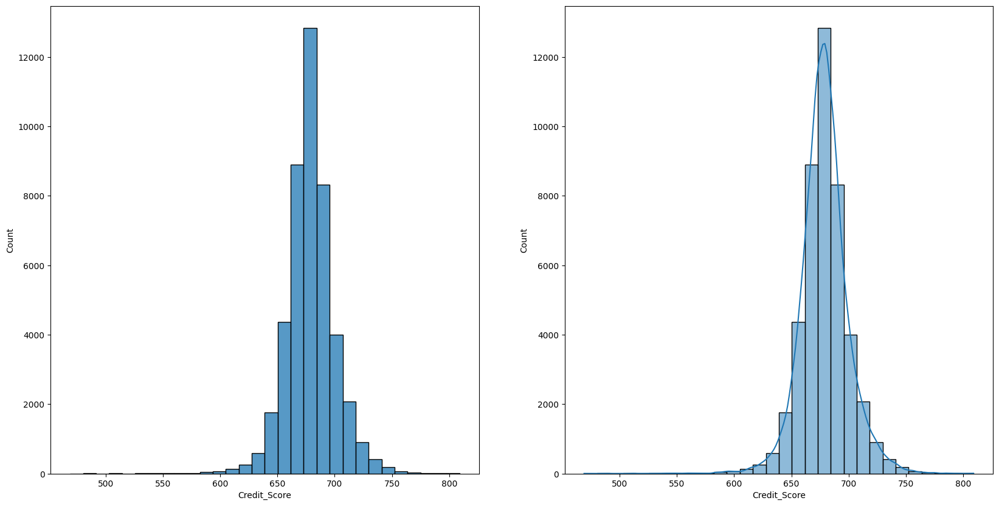

In [48]:
cols_for_visualization = ['Age_Oldest_TL', 'Age_Newest_TL', 'time_since_recent_enq', 'AGE', 'Time_With_Curr_Empr', 'Credit_Score']

for col in cols_for_visualization:
    plt.figure(figsize=(20,10))
    plt.subplot(1,2,1)
    sns.histplot(data=df, x=col,  bins=30)
    plt.subplot(1,2,2)
    sns.histplot(x=df[col], bins=30, kde=True)
    plt.show()

### Observations for numerical features:
1. Age: The given dataset show that the bank is targeting young people with the age between 20-35 years old. This is true because the monthly income of the people is also in the range of 15k-25k which true for these age group people.
2.  Credit Score: The given dataset show that the credit score of majority of people lies between 650-750.
3. pct_tl_open_L6M, pct_tl_closed_L6M pct_tl_open_L12M and pct_tl_closed_L12M': Most of the people did not open any loan accounts/trade lines in the last 6 and 12 months. This is a good sign for the bank because they can target those people with no loan left. This might decrease the non perform asset account of the bank. Same goes with opening of trade lines in the last 6-12 months
4. Tot_Missed_Pmnt: Most of the people did not missed their monthly EMI.

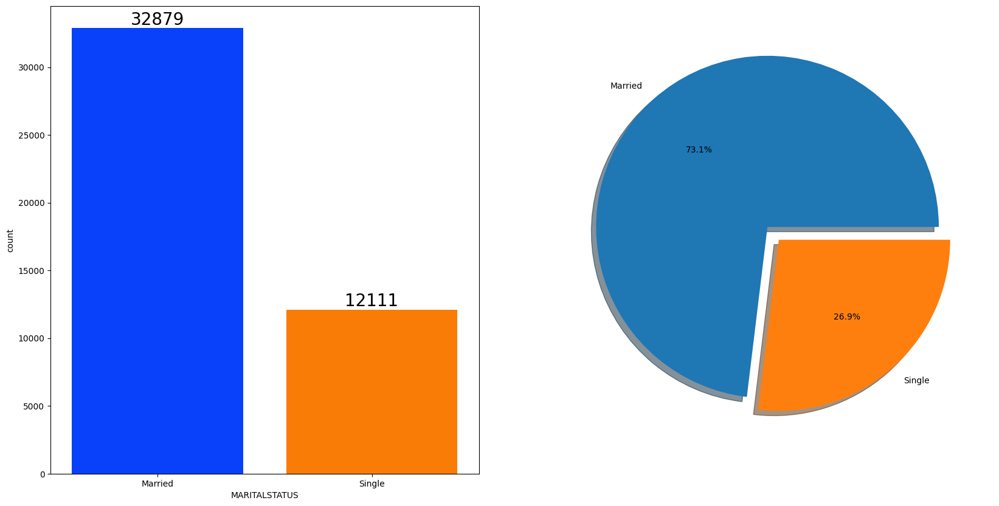

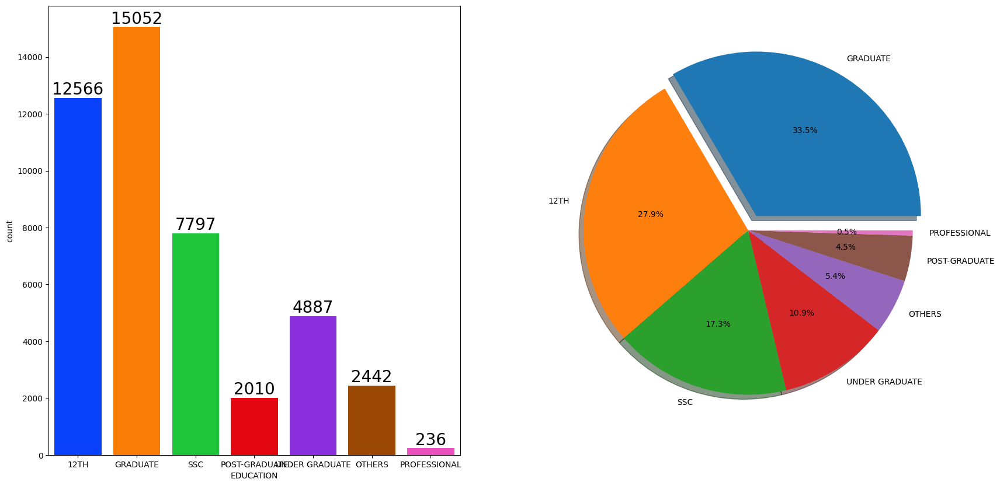

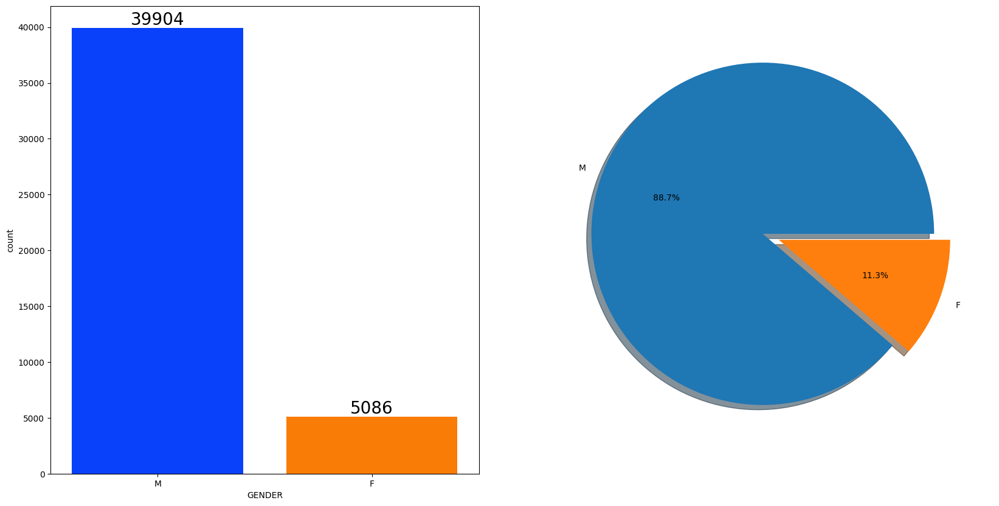

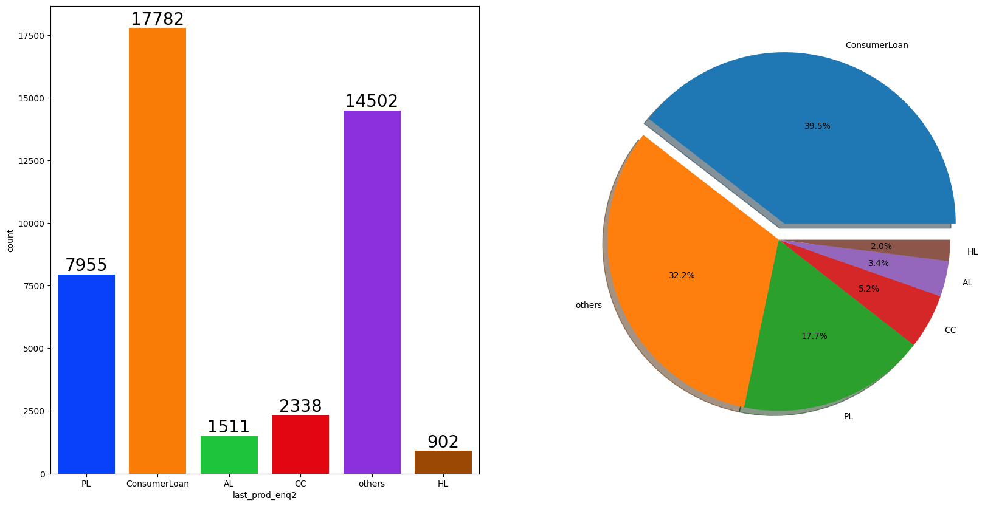

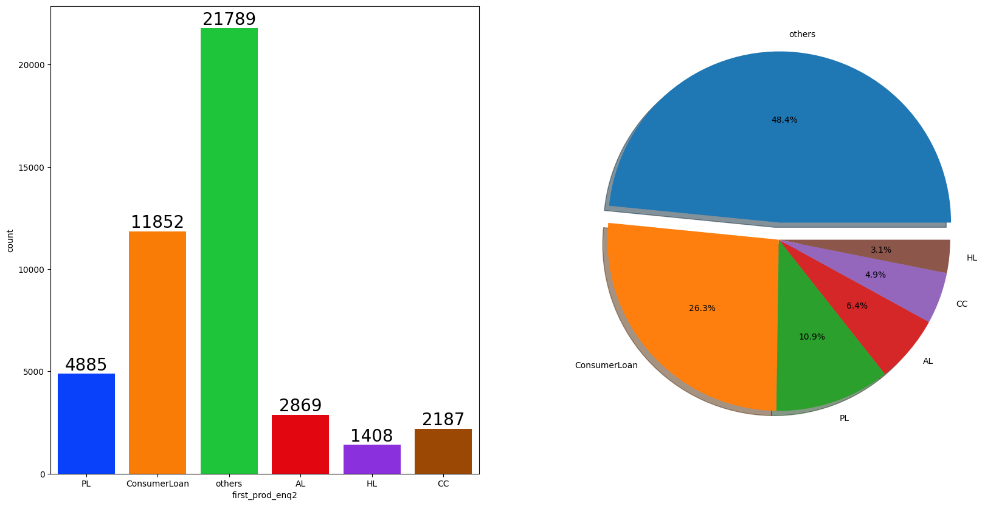

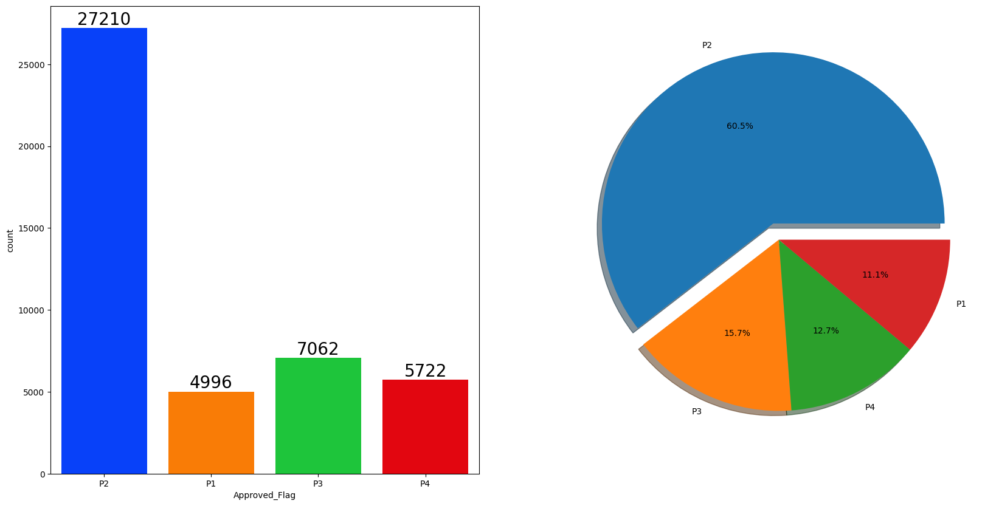

In [49]:
for co in cat_col:
    f, ax = plt.subplots(1, 2, figsize=(20, 10))
    
    # Countplot in the first subplot
    sns.countplot(x=co, data=df, palette='bright', ax=ax[0], saturation=0.95)

    for container in ax[0].containers:
        ax[0].bar_label(container, color='black', size=20)

    # Pie chart in the second subplot
    counts = df[co].value_counts()
    explode = [0.1 if count == max(counts) else 0 for count in counts]
    ax[1].pie(x=counts, labels=counts.index, explode=explode, autopct='%1.1f%%', shadow=True)

    plt.show()

#### Observations

1. 73% people are married people in the dataset.
2. This datset contains have 88% of people as men who are likely to taken loan from the bank.
3. Graduate people have more likelihood of taking or applying for loans. Banks also have more likelihood of approving of loans to the graduate or educated people.
4. Previous loans taken by the people in this dataset is other loan or consumer loans (such as furniture loan, fridge loan etc).
5. Most of the people in the dataset flows under P2 category for loan approval. 

In [50]:
pip install --upgrade pip

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


In [51]:
pip install --upgrade nbformat


Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


In [52]:
visualization = [ 'Credit_Score', 'AGE','Age_Oldest_TL', 'Time_With_Curr_Empr']
for cols in visualization:
    fig = px.box(data_frame = df, x='GENDER', y=cols, color='Approved_Flag')
    fig.update_layout(title_text=f'{cols} distribution w.r.t gender in all categories')
    fig.show()

In [53]:
visualization = [ 'Credit_Score', 'AGE','Age_Oldest_TL', 'Time_With_Curr_Empr']
for cols in visualization:
    fig = px.box(data_frame = df, x='MARITALSTATUS', y=cols, color='Approved_Flag')
    fig.update_layout(title_text=f'{cols} distribution w.r.t gender in all categories')
    fig.show()

### Observation of numerical and categorical cols w.r.t target variable (Approved_Flag)
1. P1 category range is (701-809)
2. P2 category range is(669-700)
3. P3 category range is (489-776)
4. P3 category of target variable are the most ambiguous category. This can be observed by looking at the credit score min and max value for P3 category which range from 489 to 776, whereas in case of P2 it's range from 669 to 701. 
5. Due to the most ambiguous category i.e P3, during the predict also, the accuracy of the model is significantly decreases due to the most ambiguous category. 
6. The median age who are getting P1 category loan are bit older than other categories. For eg. median age for P1 category is 40 whereas for P2 category it is 33 and for P3 category it is 31. Therefore it can be assumed that as the age increases, loan approval becomes easier. 
7. 

In [54]:
grouped_df = df.groupby('Approved_Flag')

# List of columns you want to calculate statistics for
visualization = ['Credit_Score', 'AGE', 'Age_Oldest_TL', 'Time_With_Curr_Empr']

# Iterate through each column in the visualization list
for col in visualization:
    # Calculate min, max, and median for each group in 'Approved_Flag'
    min_values = grouped_df[col].min()
    max_values = grouped_df[col].max()
    median_values = grouped_df[col].median()
    
    # Display the statistics
    print(f"Statistics for '{col}' with respect to 'Approved_Flag':")
    print(f"Minimum values:\n{min_values}\n")
    print(f"Maximum values:\n{max_values}\n")
    print(f"Median values:\n{median_values}\n")

Statistics for 'Credit_Score' with respect to 'Approved_Flag':
Minimum values:
Approved_Flag
P1    701
P2    669
P3    489
P4    469
Name: Credit_Score, dtype: int64

Maximum values:
Approved_Flag
P1    809
P2    700
P3    776
P4    658
Name: Credit_Score, dtype: int64

Median values:
Approved_Flag
P1    712.0
P2    681.0
P3    665.0
P4    650.0
Name: Credit_Score, dtype: float64

Statistics for 'AGE' with respect to 'Approved_Flag':
Minimum values:
Approved_Flag
P1    21
P2    21
P3    21
P4    21
Name: AGE, dtype: int64

Maximum values:
Approved_Flag
P1    65
P2    67
P3    63
P4    63
Name: AGE, dtype: int64

Median values:
Approved_Flag
P1    39.0
P2    32.0
P3    30.0
P4    29.0
Name: AGE, dtype: float64

Statistics for 'Age_Oldest_TL' with respect to 'Approved_Flag':
Minimum values:
Approved_Flag
P1    7
P2    0
P3    0
P4    0
Name: Age_Oldest_TL, dtype: int64

Maximum values:
Approved_Flag
P1    373
P2    288
P3    385
P4    249
Name: Age_Oldest_TL, dtype: int64

Median values:

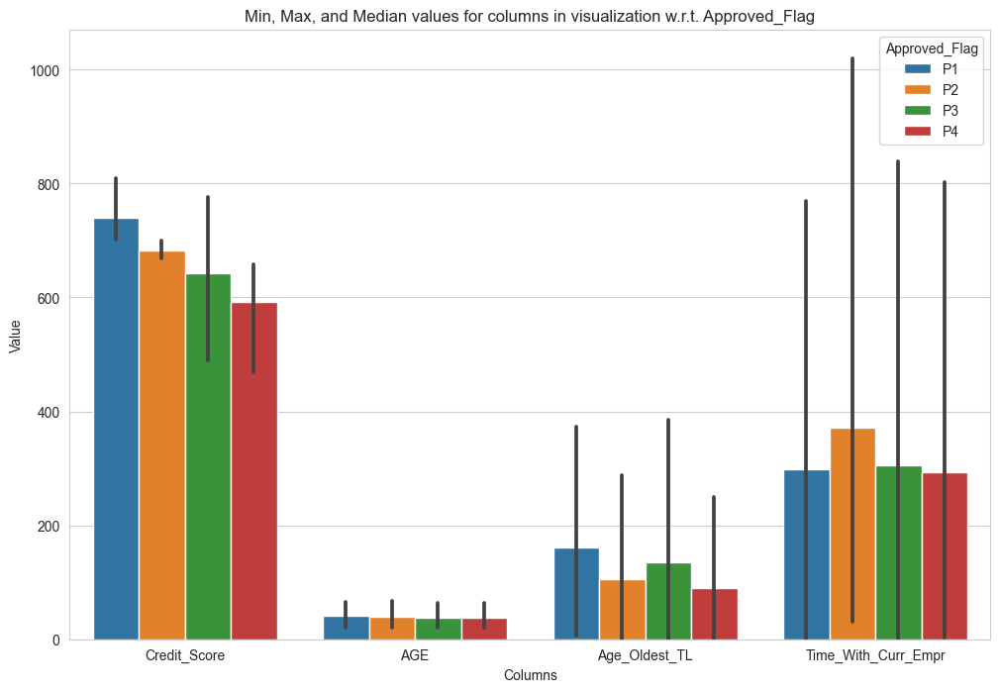

In [55]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Group the data frame by 'Approved_Flag'
grouped_df = df.groupby('Approved_Flag')

# List of columns you want to calculate statistics for
visualization = ['Credit_Score', 'AGE', 'Age_Oldest_TL', 'Time_With_Curr_Empr']

# Create a list to hold the data for plotting
plot_data = []

# Iterate through each column in the visualization list
for col in visualization:
    # Calculate min, max, and median for each group in 'Approved_Flag'
    min_values = grouped_df[col].min()
    max_values = grouped_df[col].max()
    median_values = grouped_df[col].median()
    
    # Store the calculated statistics in a DataFrame
    stats_df = pd.DataFrame({
        'Approved_Flag': min_values.index,
        'Min': min_values.values,
        'Max': max_values.values,
        'Median': median_values.values,
    })
    stats_df['Column'] = col
    plot_data.append(stats_df)

# Combine all data for plotting
plot_df = pd.concat(plot_data)

# Set the style and size of the plot
sns.set_style("whitegrid")
plt.figure(figsize=(12, 8))

# Plot the data using seaborn
sns.barplot(x='Column', y='value', hue='Approved_Flag', data=plot_df.melt(id_vars=['Approved_Flag', 'Column'], var_name='Statistic', value_name='value'))

# Add labels and title
plt.title('Min, Max, and Median values for columns in visualization w.r.t. Approved_Flag')
plt.xlabel('Columns')
plt.ylabel('Value')
plt.legend(title='Approved_Flag')

# Show the plot
plt.show()


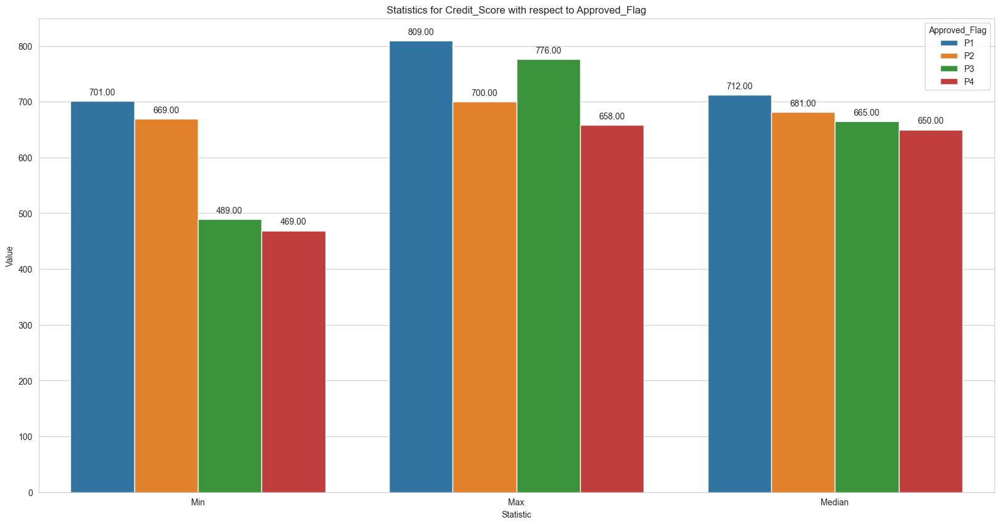

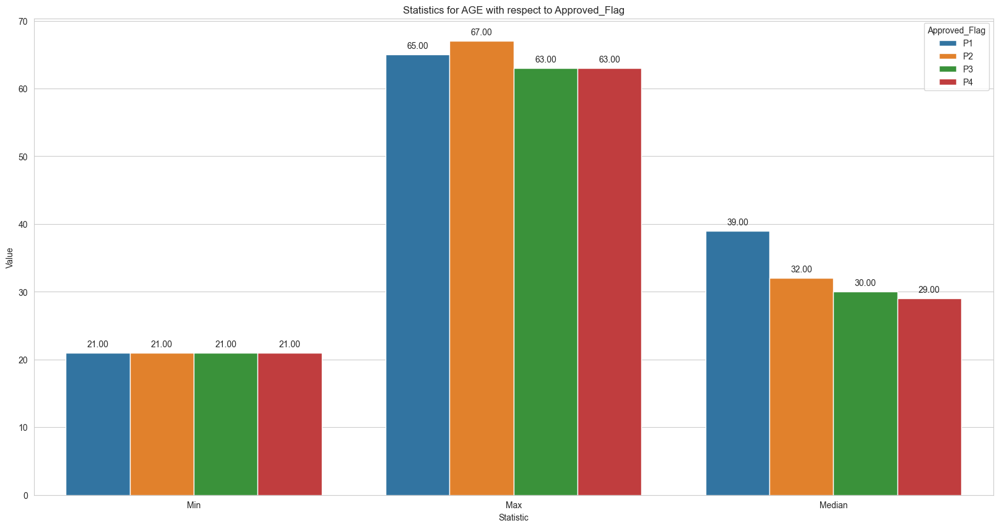

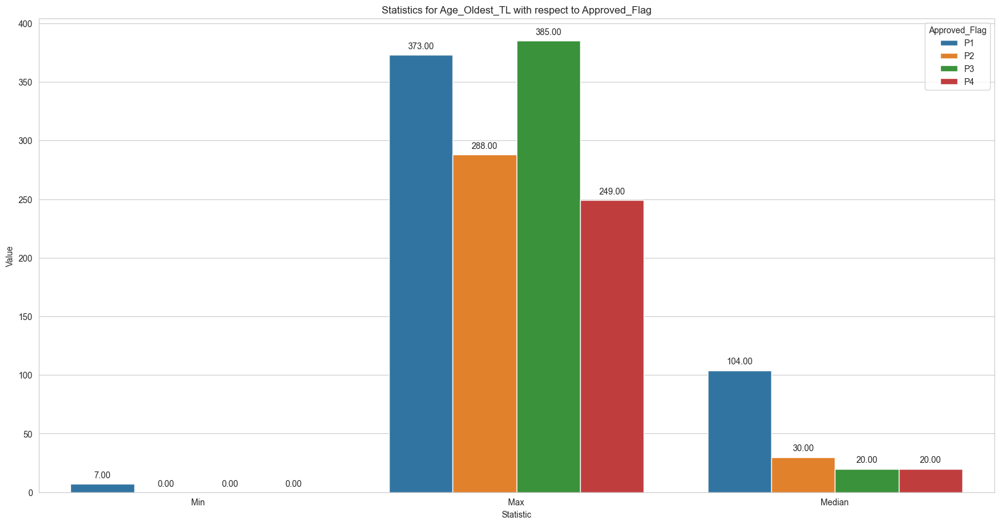

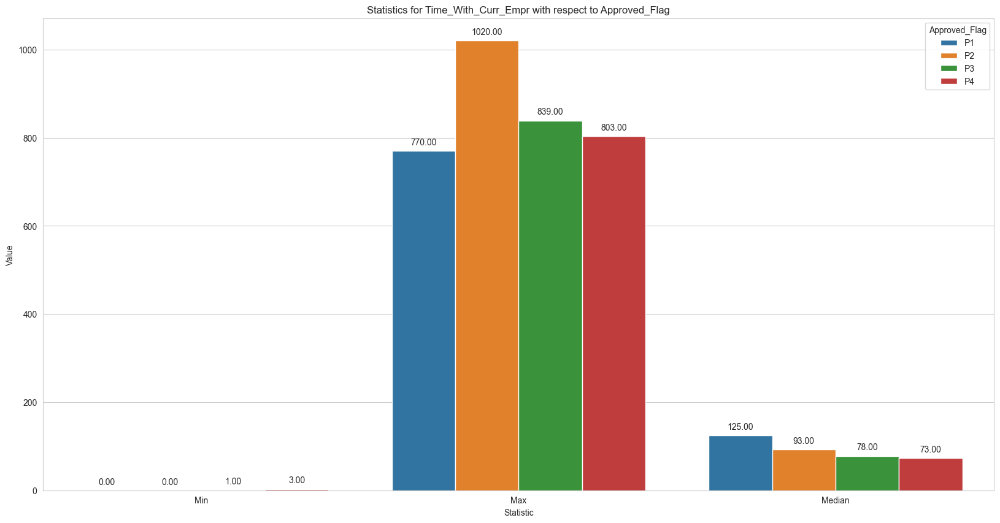

In [56]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Group the data frame by 'Approved_Flag'
grouped_df = df.groupby('Approved_Flag')

# List of columns you want to calculate statistics for
visualization = ['Credit_Score', 'AGE', 'Age_Oldest_TL', 'Time_With_Curr_Empr']

# Iterate through each column in the visualization list
for col in visualization:
    # Calculate min, max, and median for each group in 'Approved_Flag'
    min_values = grouped_df[col].min()
    max_values = grouped_df[col].max()
    median_values = grouped_df[col].median()
    
    # Create a DataFrame with the calculated statistics
    stats_df = pd.DataFrame({
        'Approved_Flag': min_values.index,
        'Min': min_values.values,
        'Max': max_values.values,
        'Median': median_values.values,
    })
    stats_df = stats_df.melt(id_vars='Approved_Flag', var_name='Statistic', value_name='Value')
    
    # Plot the data using seaborn
    plt.figure(figsize=(20, 10))
    sns.barplot(x='Statistic', y='Value', hue='Approved_Flag', data=stats_df)
    
    # Annotate each bar with its value
    for p in plt.gca().patches:
        plt.gca().annotate(format(p.get_height(), '.2f'),  # Format the value to 2 decimal places
                           (p.get_x() + p.get_width() / 2, p.get_height()),  # x and y positions
                           ha='center', va='center', xytext=(0, 10), textcoords='offset points')
    
    # Set plot title and labels
    plt.title(f'Statistics for {col} with respect to Approved_Flag')
    plt.xlabel('Statistic')
    plt.ylabel('Value')
    plt.legend(title='Approved_Flag')
    
    # Show the plot
    plt.show()
